In [1]:
# Importing all the libraries needed
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
import pandas as pd
import os, requests, cv2, random
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import Sequential, layers
from keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
from sklearn.metrics import confusion_matrix,classification_report
import misFunciones as m

### Dataset: 

CC BY 4.0 licence description
The files associated with this dataset are licensed under a Creative Commons Attribution 4.0 International licence.

cite: Huang, Mei-Ling; Chang, Ya-Han (2020), “Dataset of Tomato Leaves”, Mendeley Data, V1, doi: 10.17632/ngdgg79rzb.1

### 1. Carga del dataset y preprocesado:
* Importamos el conjunto de datos obtenido de Mendeley Data, este se dividio en 3 directorios donde guardamos en local debido al peso de las carpetas el conjunto de test, train y validación.

In [2]:
# Cargar las fotos de las hojas tomates.

train_data_dir = r"C:\Users\56981\Desktop\Master Clases\16. TFM\nuevos_datos\plant_village\train"
test_data_dir = r"C:\Users\56981\Desktop\Master Clases\16. TFM\nuevos_datos\plant_village\test"
val_data_dir = r"C:\Users\56981\Desktop\Master Clases\16. TFM\nuevos_datos\plant_village\val"

### Instanciamos la clase ImageDataGenerator para cada conjunto de datos importados, train, test y val. 
Preprocesamos las imagenes pasandole los siguientes parametros a la clase: 
 * rescale : Se normalizan los valores de los pixeles al rango [0,1].
 * shear_range: Se aplica distorsión a las imagenes (Solo al conjunto de train)
 * zoom_range : Se realizan zoom aleatorios a las imagenes (Solo al conjunto de train)
 * horizontal_flip: Se realiza una inversion horizontal aleatoria de las imagenes, aumentando la variabilidad de los datos de entrenamiento (Solo al conjunto de train)

In [3]:
# Utilizamos la función Image Data Generator para los conjuntos de datos.

train_datagen = ImageDataGenerator(rescale=1/255.0,
                               shear_range=0.2,
                                zoom_range=0.2,
                                horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1/255.0)


val_datagen = ImageDataGenerator(rescale=1/255.0)


Se configura los generadores de flujos de datos: 
* target_size: Se especifica el tamaño al que se redimensionaran las imagenes cargadas (224, 224). 
* batch_size: Indicamos el lote de imagenes que procesará y cargarán a la vez.
* shuffle: Se indica Shuffle True para que mezcle las imagenes 
* class_mode: Se indica que estamos ante un problema de clasificación de imagenes

In [4]:
train_gen = train_datagen.flow_from_directory(
                                train_data_dir,
                                target_size=(224, 224),
                                batch_size=32,
                                shuffle=True,
                                class_mode='categorical',
                                subset='training')

Found 8715 images belonging to 10 classes.


In [5]:
val_gen = val_datagen.flow_from_directory(
                                val_data_dir,
                                target_size=(224,224),
                                batch_size=32,
                                class_mode='categorical',
                                shuffle = True)

Found 2902 images belonging to 10 classes.


In [6]:
test_gen = test_datagen.flow_from_directory(
        test_data_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical',
        shuffle = False)

Found 2914 images belonging to 10 classes.


Podemos observar que para el conjunto de entrenamiento tenemos 8715 imagenes, 2902 en el conjunto de validación y 2914 para el conjunto de testeo.

### Distribución de clases por cada enfermedad presente en el dataset de train.

In [34]:
# Lista de directorios de fotos (Nombre de clases)
class_names = [folder for folder in sorted(os.listdir(train_data_dir))]

# Calculo de la distribución por clase, contando las imagenes contenidas en cada directorio.
class_distribution = [len(os.listdir(os.path.join(train_data_dir, name))) for name in class_names]

# Gráfico de distribución de clases.
m.plot_class_distribution(class_distribution, class_names, title="Distribución de Clases")

Se observa que las clases se encuentran desbalanceadas, un 30% de la imagenes correspondientes a la enfermedad "Tomato_Yellow_Leaf_Curl_Virus" siendo esta la clase mayoritaria. Además se puede ver que la clase minoritaria corresponde a la enfermedad "Tomato_mosaic_virus".

Es por esto que se decide realizar un ajuste de pesos para cada clase. 

### Ajuste Pesos de Clases

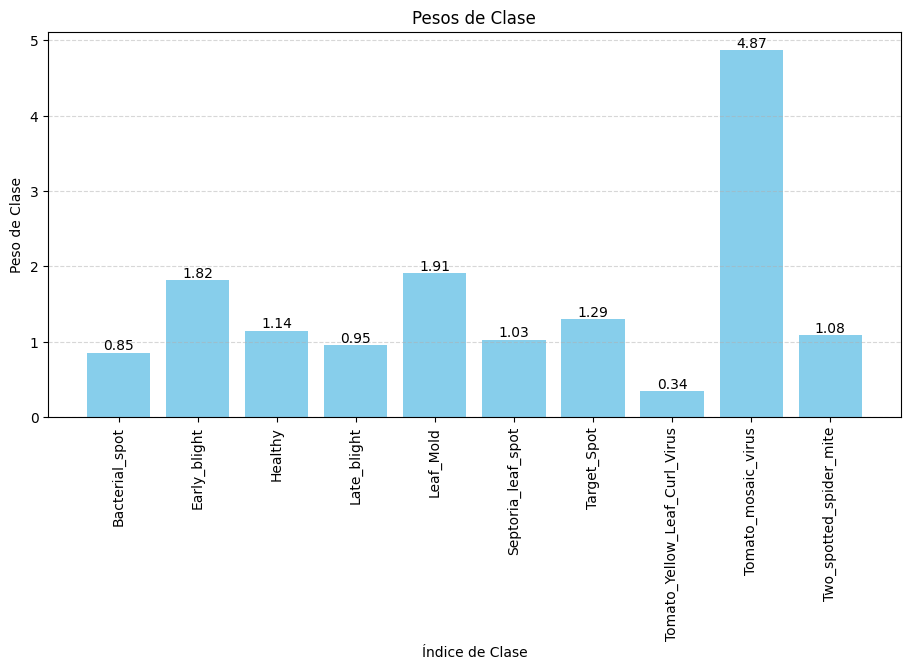

In [10]:
total_samples = sum(class_distribution)
class_weights = {i: total_samples / (len(class_distribution) * count) for i, count in enumerate(class_distribution)}
m.plot_class_weights(class_weights,class_names)

De forma inversamente proporcional a la cantidad de fotos existentes en cada clase, se le asignan pesos a cada enfermedad para ayudar al entrenamiento del modelo.

### Creación Modelo CNN con tasa de aprendizaje 0.001

Se elige un modelo secuencial de Keras: 

* Se añade una primera capa convucional de entrada de 32 neuronas y una funcion de activacion relu, las siguientes capas siguen el mismo patron, una convucional de 64 y un MaxPooling de 2x2.
* Se añade una capa de Flatten conectada a la capa densa con una función de activación relu.
* La última capa tiene una función de activación softmax para generar una función de probabilidad sobre las 10 clases para poder clasificar cada imagen.

In [11]:
# Capas del Modelo CNN

cnn = models.Sequential()

cnn.add(layers.Conv2D (32, kernel_size = (3, 3), activation='relu', input_shape = [224, 224,3])),
cnn.add(layers.MaxPooling2D(pool_size = (2, 2))),

cnn.add(layers.Conv2D(64, (3, 3), activation='relu')),
cnn.add(layers. MaxPooling2D((2, 2))),

cnn.add(layers.Conv2D (64, (3, 3), activation='relu')),
cnn.add(layers.MaxPooling2D((2, 2))),

cnn.add(layers.Conv2D(64, (3, 3), activation='relu')), 
cnn.add(layers.MaxPooling2D((2, 2))),

cnn.add(layers. Conv2D (64, (3, 3), activation='relu')), 
cnn.add(layers.MaxPooling2D((2, 2))),

cnn.add(layers.Flatten()),

cnn.add(layers.Dense(64,activation='relu'))

#Capa de Salida (output)
cnn.add(layers.Dense(10,activation='softmax'))

### Resumen Modelo CNN

In [12]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 64)       0

In [13]:
# Se aplica ratio de aprendizaje 0.001 al modelo.
opt = keras.optimizers.Adam(learning_rate=0.001)

### Compilación del modelo

In [14]:
cnn.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

Se utiliza la función de pérdida de entropía cruzada categórica y la métrica utilizada será la precisión (accuracy) la cual mide la proporción de de predicciónes correctas en relación con el total de predicciones.

Antes de entrenar el modelo, se realiza la aplicación de un Early Stopping para evitar sobreajuste del modelo.

In [15]:
es = EarlyStopping(monitor = 'val_accuracy', 
                   mode = 'max', 
                   patience = 10, 
                   verbose = 1, 
                   restore_best_weights = True)

### Fit del Modelo

In [16]:
history = cnn.fit(x = train_gen,
                    callbacks = [es], 
                    steps_per_epoch = 8715/32,
                    epochs = 100,
                    validation_steps = 2902/32,
                    validation_data = val_gen,
                    class_weight = class_weights)  

Epoch 1/100
272/272 [==============================] - 392s 1s/step - loss: 1.7792 - accuracy: 0.4137 - val_loss: 1.1385 - val_accuracy: 0.6113
Epoch 2/100
272/272 [==============================] - 332s 1s/step - loss: 1.1849 - accuracy: 0.6193 - val_loss: 1.0345 - val_accuracy: 0.6309
Epoch 3/100
272/272 [==============================] - 343s 1s/step - loss: 0.8216 - accuracy: 0.7406 - val_loss: 0.6536 - val_accuracy: 0.7726
Epoch 4/100
272/272 [==============================] - 342s 1s/step - loss: 0.6247 - accuracy: 0.8039 - val_loss: 0.5619 - val_accuracy: 0.8032
Epoch 5/100
272/272 [==============================] - 343s 1s/step - loss: 0.5114 - accuracy: 0.8400 - val_loss: 0.3564 - val_accuracy: 0.8694
Epoch 6/100
272/272 [==============================] - 346s 1s/step - loss: 0.5351 - accuracy: 0.8289 - val_loss: 0.4263 - val_accuracy: 0.8498
Epoch 7/100
272/272 [==============================] - 358s 1s/step - loss: 0.4079 - accuracy: 0.8744 - val_loss: 0.3021 - val_accuracy:

Para steps_per_epoch, el cálculo es el siguiente: 8715 imágenes de entrenamiento divididas por lotes de tamaño 32 es igual a aproximadamente 272. Esto significa que durante cada época de entrenamiento, el modelo procesará 272 lotes, cada uno con 32 imágenes.

En cuanto a validation_steps, se realiza el siguiente cálculo: 2902 imágenes de validación divididas por lotes de tamaño 32 es igual a aproximadamente 91. Esto indica que durante cada época de validación, el modelo procesará 91 lotes, cada uno con 32 imágenes.

El early stopping actuó en la Epoca 29, debido a que el modelo al entrenarse en este punto no encontraba una forma de mejora en la métrica de evaluación de precisión.

La mejor época fue la 19 con un val-loss de 0.1746 y un val-accuracy de 0.9411

### Prueba del modelo con conjunto de Test

In [17]:
scores = cnn.evaluate(test_gen)

92/92 [==============================] - 40s 437ms/step - loss: 0.1900 - accuracy: 0.9458


Al probar el modelo con el conjunto de test se obtiene una precisión del modelo de 0.9458, y un loss de 0.1900.

### Gráficos de Métrica Precisión y Función de Pérdida

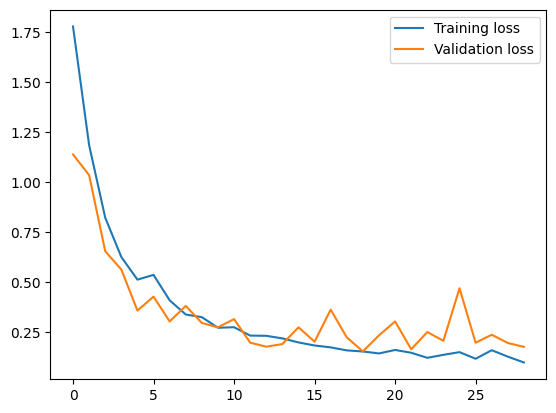

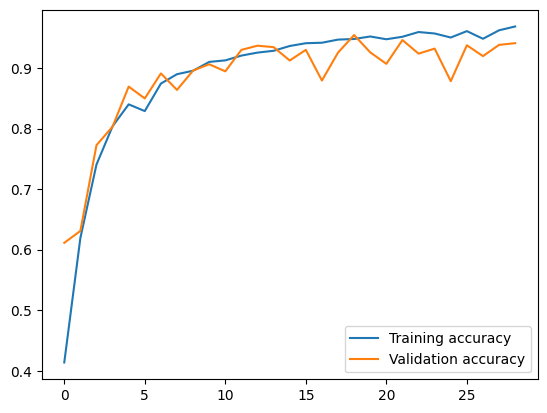

In [18]:
# Gráfico de Función de Pérdida
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

# Gráfico de Accuracy
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.legend()
plt.show()

### Guardar Modelo

In [19]:
# Guardado del modelo.
cnn.save('cnn_with_weights_v2.h5')

Luego de varias iteraciónes y distintos modelos esté fue el definitivo. Se utilizará luego para realizar las predicciones dentro de la API al entregarle imagenes de hojas de tomate.

### Predicciones, Matriz de Confusión y Métricas.

#### Predicciones:

In [20]:
# Cálculo de número steps (lotes) se necesitarán para procesar todas las muestras.
test_steps_per_epoch = np.math.ceil(test_gen.samples / test_gen.batch_size)

In [21]:
# Predicción de Clases
predictions = cnn.predict(test_gen, steps=test_steps_per_epoch)

92/92 [==============================] - 20s 220ms/step


In [22]:
# Array de predicciones.
predictions[1]

array([9.92172718e-01, 1.45413156e-03, 1.89916876e-12, 1.85698864e-05,
       1.96067673e-09, 1.22440555e-08, 1.53905266e-09, 6.35453593e-03,
       1.15868367e-17, 2.79550723e-11], dtype=float32)

In [23]:
# Clases predichas por el modelo.
predicted_classes = np.argmax(predictions,axis=1)

In [24]:
# Obtención de clases reales y etiquetas de clase.
true_classes = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

#### Matriz de Confusión:

In [25]:
# Print de la matriz de confusión.
confusion_matrix = confusion_matrix(test_gen.classes, predicted_classes)
print(confusion_matrix)

[[315   7   0   0   0   2   4  13   0   0]
 [  4 136   0  13   3   0   1   1   2   0]
 [  0   0 255   0   0   0   0   0   0   0]
 [  1   9   1 285   5   2   1   2   0   1]
 [  0   0   1   1 138  12   0   0   0   1]
 [  0   3   0   4   5 266   5   0   1   0]
 [  1   0   4   1   2   5 203   0   3   7]
 [  1   0   0   2   5   0   0 847   0   3]
 [  0   0   0   0   1   0   0   0  60   0]
 [  0   0   0   0   5   0  12   0   1 251]]


In [26]:
# Reporte de clasificación, donde se ve precision, recall y F1 Score.
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

                               precision    recall  f1-score   support

               Bacterial_spot       0.98      0.92      0.95       341
                 Early_blight       0.88      0.85      0.86       160
                      Healthy       0.98      1.00      0.99       255
                  Late_blight       0.93      0.93      0.93       307
                    Leaf_Mold       0.84      0.90      0.87       153
           Septoria_leaf_spot       0.93      0.94      0.93       284
                  Target_Spot       0.90      0.90      0.90       226
Tomato_Yellow_Leaf_Curl_Virus       0.98      0.99      0.98       858
          Tomato_mosaic_virus       0.90      0.98      0.94        61
      Two_spotted_spider_mite       0.95      0.93      0.94       269

                     accuracy                           0.95      2914
                    macro avg       0.93      0.93      0.93      2914
                 weighted avg       0.95      0.95      0.95      2914



Se observa que la clase Early_blight es la clase que peor predice el modelo con un 0.86 de f1-score promediando la precision y el recall.

Se observa que la clase Tomato_Yellow_leaf_Curl_virus es la que mejor predice el modelo con un 0.98 de f1-score, esto tiene sentido ya que es la clase mayoritaria en la que se pudo obtener un entrenamiento mayor.

### Visualización de Predicción mostrando imagenes, con su Clase real: Actual y su clase predicha: Predicted

Función predictImages de misFunciones.py

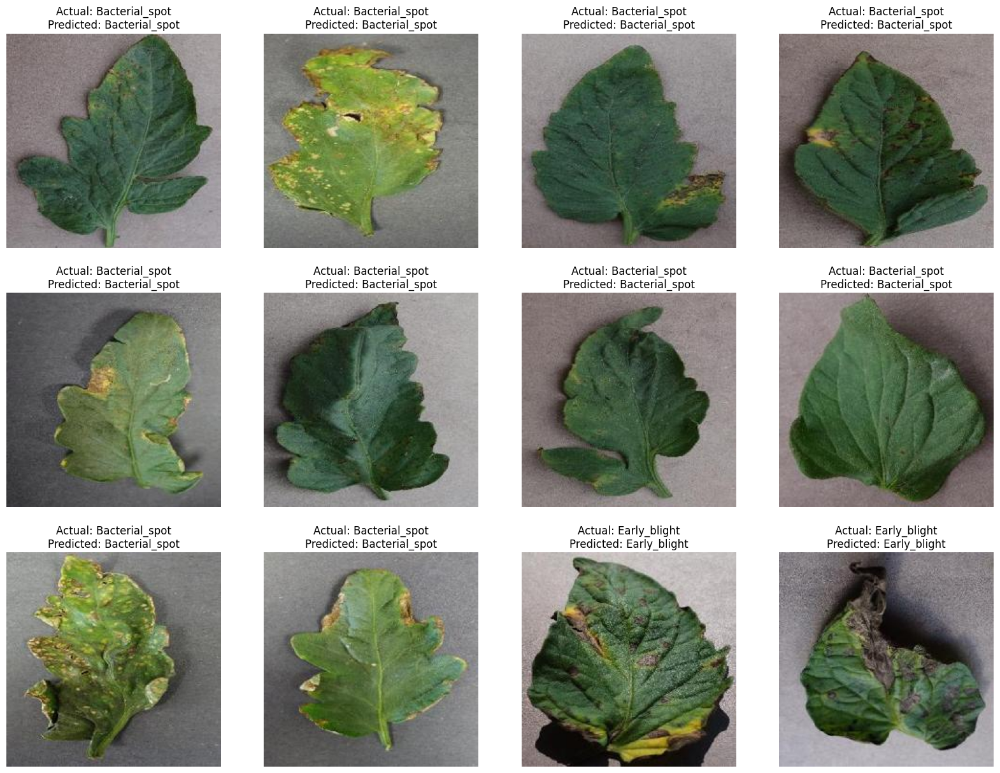

In [30]:
m.predictImages(test_gen, class_names, cnn)

Función plot_images de misFunciones.py, para mostrar y visualizar las imagenes con su etiqueta.

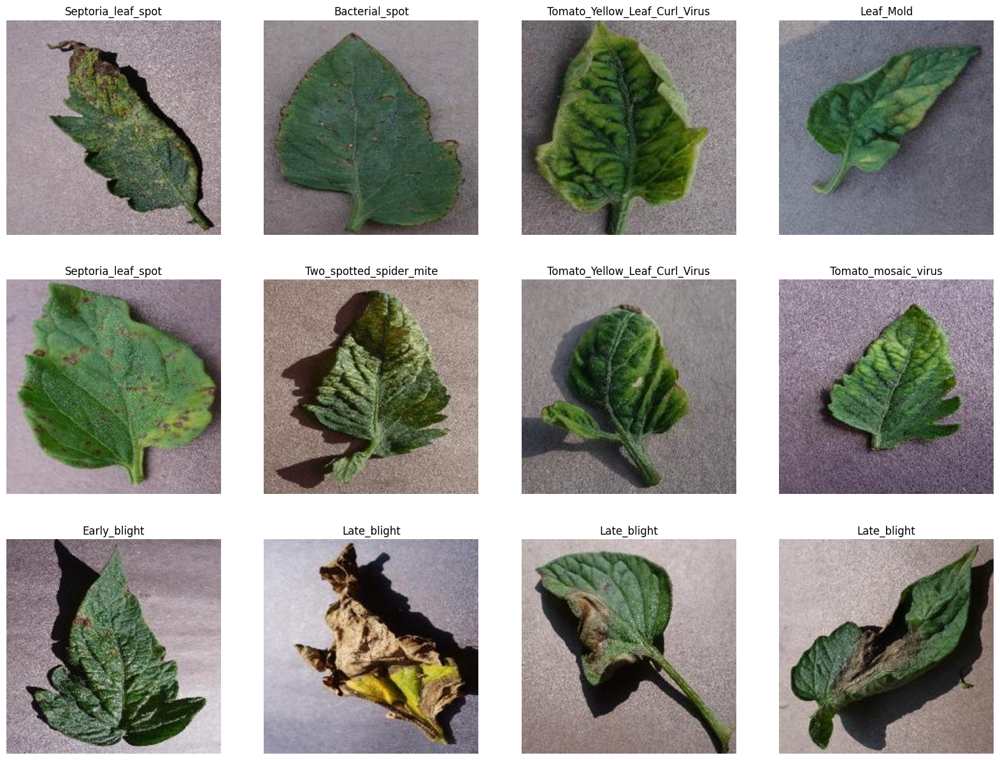

In [31]:
m.plot_images(val_gen,class_names)

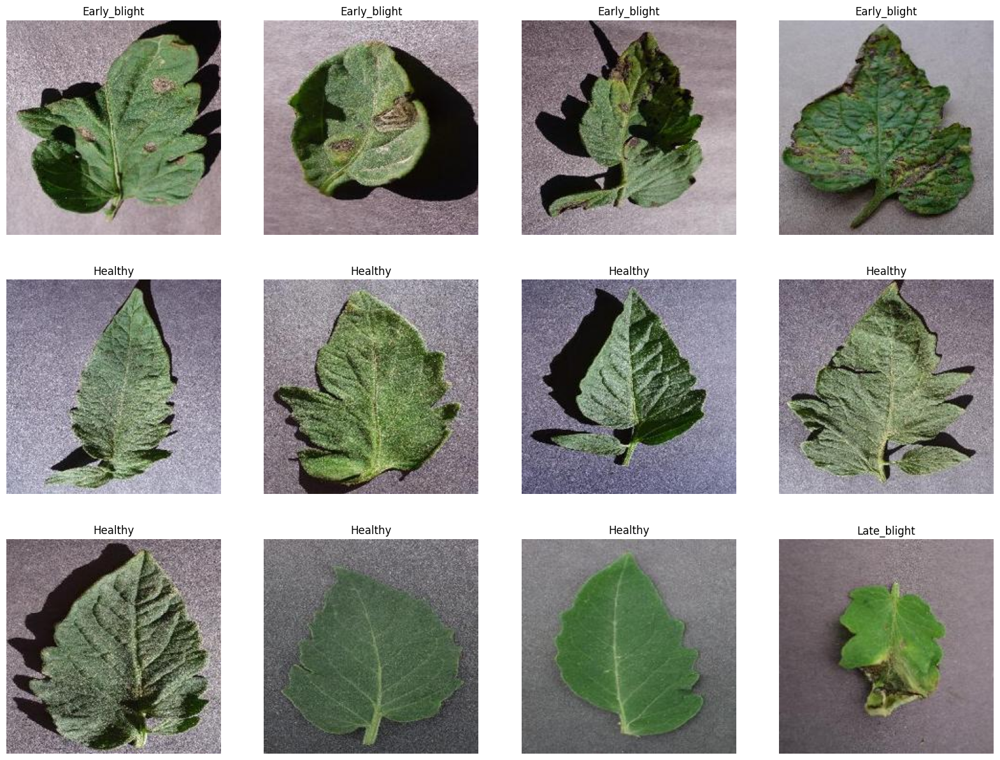

In [32]:
m.plot_images(test_gen,class_names)

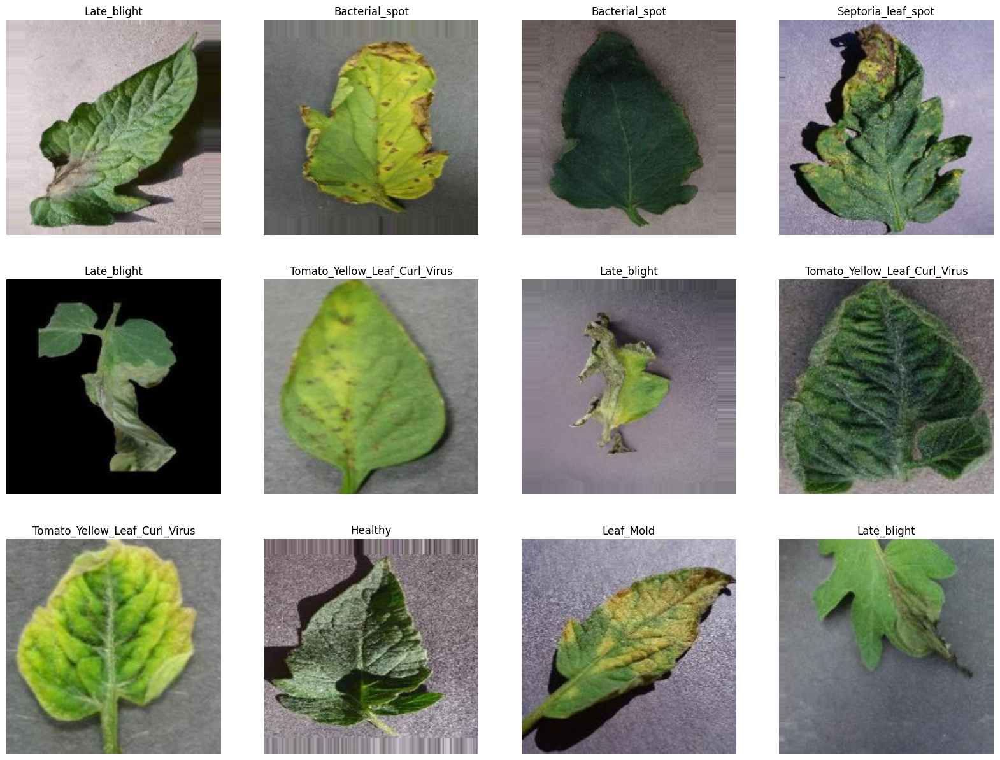

In [33]:
m.plot_images(train_gen,class_names)